In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
import networkx as nx
warnings.filterwarnings('ignore')

# Set styling for better visualizations
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.3.5 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "C:\Users\olafs\AppData\Local\Programs\Python\Python312\Lib\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "C:\Users\olafs\AppData\Local\Programs\Python\Python312\Lib\site-packages\traitlets\config\application.py", line 1043, in launch_instance
    app.start()
  File "C:\Users\olafs\AppData\Local\Programs\Python\Python312\Lib\site-packages\ipykernel\kernelapp.py", 

ImportError: 
A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.3.5 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.



ImportError: numpy.core.multiarray failed to import

In [2]:
# Load the data
# Replace with your actual file path
df = pd.read_csv('data_concat_10y.csv')

# Display basic information
print("Dataset shape:", df.shape)
print("\nFirst few rows:")
display(df.head())

# Check data types and missing values
print("\nData types:")
display(df.dtypes)

print("\nMissing values:")
display(df.isnull().sum())

# Convert date to datetime
df['date'] = pd.to_datetime(df['date'])

# Set date as index for time series analysis
df_ts = df.copy()
df_ts.set_index('date', inplace=True)


Dataset shape: (43848, 21)

First few rows:


,date,temperature_2m_max,temperature_2m_min,temperature_2m_mean,cloud_cover_mean,relative_humidity_2m_mean,soil_moisture_7_to_28cm_mean,soil_moisture_0_to_7cm_mean,soil_temperature_0_to_7cm_mean,soil_temperature_7_to_28cm_mean,...,precipitation_hours,wind_speed_10m_max,daylight_duration,snowfall_sum,surface_pressure_mean,surface_pressure_max,surface_pressure_min,winddirection_10m_dominant,et0_fao_evapotranspiration_sum,city
0,2015-05-13 22:00:00+00:00,13.778501,7.0285,10.088918,55.125000,78.114100,0.208042,0.239125,11.647251,11.438915,...,6.0,16.575644,57160.816,0.0,991.01150,993.03750,989.96844,288.79123,2.803242,Olsztyn
1,2015-05-14 22:00:00+00:00,12.778501,5.3285,8.853501,44.541668,71.074140,0.209958,0.243833,10.557668,10.770167,...,3.0,24.442913,57363.610,0.0,994.29865,999.44230,991.82104,299.26560,2.990042,Olsztyn
2,2015-05-15 22:00:00+00:00,14.978500,3.2785,9.976417,52.333332,61.648470,0.209125,0.228792,9.955584,9.853499,...,0.0,20.608230,57562.656,0.0,999.02880,1000.17980,996.76074,268.77536,2.948370,Olsztyn
3,2015-05-16 22:00:00+00:00,12.778501,7.5785,9.822251,58.541668,69.151500,0.207125,0.222667,10.784751,10.465999,...,6.0,27.887802,57757.676,0.0,997.73706,999.00940,996.01660,275.92150,2.981852,Olsztyn
4,2015-05-17 22:00:00+00:00,13.628500,6.1285,9.895167,57.000000,61.507065,0.204750,0.219167,10.326417,10.151416,...,2.0,26.678890,57948.383,0.0,995.97510,998.39685,993.37195,271.32965,3.076541,Olsztyn



Data types:


date                                object
temperature_2m_max                 float64
temperature_2m_min                 float64
temperature_2m_mean                float64
cloud_cover_mean                   float64
relative_humidity_2m_mean          float64
soil_moisture_7_to_28cm_mean       float64
soil_moisture_0_to_7cm_mean        float64
soil_temperature_0_to_7cm_mean     float64
soil_temperature_7_to_28cm_mean    float64
rain_sum                           float64
precipitation_hours                float64
wind_speed_10m_max                 float64
daylight_duration                  float64
snowfall_sum                       float64
surface_pressure_mean              float64
surface_pressure_max               float64
surface_pressure_min               float64
winddirection_10m_dominant         float64
et0_fao_evapotranspiration_sum     float64
city                                object
dtype: object


Missing values:


date                               0
temperature_2m_max                 0
temperature_2m_min                 0
temperature_2m_mean                0
cloud_cover_mean                   0
relative_humidity_2m_mean          0
soil_moisture_7_to_28cm_mean       0
soil_moisture_0_to_7cm_mean        0
soil_temperature_0_to_7cm_mean     0
soil_temperature_7_to_28cm_mean    0
rain_sum                           0
precipitation_hours                0
wind_speed_10m_max                 0
daylight_duration                  0
snowfall_sum                       0
surface_pressure_mean              0
surface_pressure_max               0
surface_pressure_min               0
winddirection_10m_dominant         0
et0_fao_evapotranspiration_sum     0
city                               0
dtype: int64

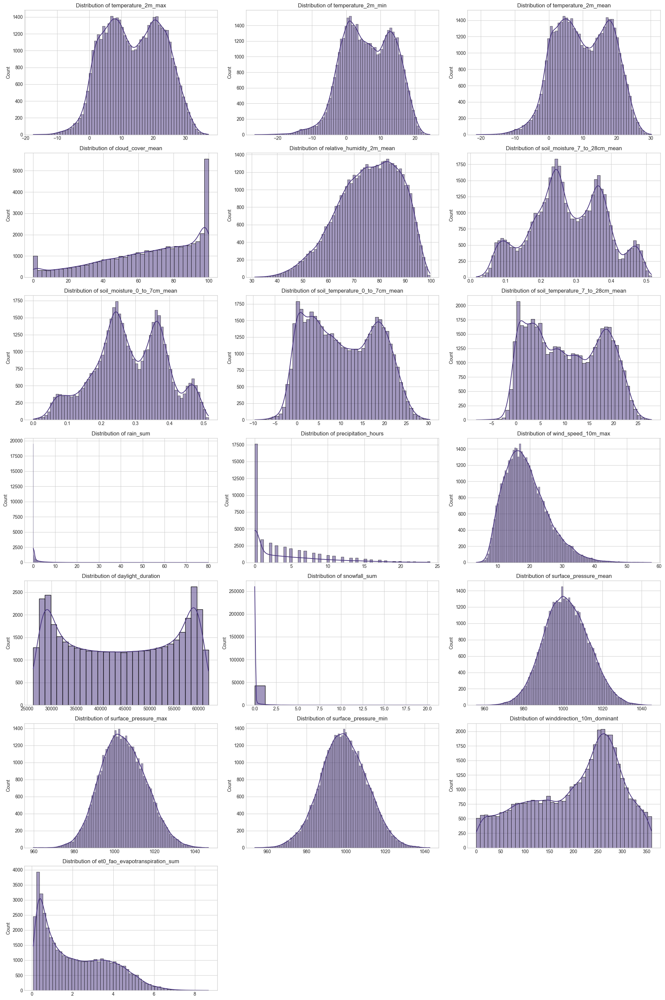

Column: temperature_2m_max
Mean: 13.8969
Std Dev: 9.0339
Min: -17.5175
25%: 6.5370
Median: 13.8325
75%: 21.3370
Max: 37.2585

Column: temperature_2m_min
Mean: 6.2857
Std Dev: 7.2840
Min: -26.6675
25%: 0.7195
Median: 6.1365
75%: 12.3781
Max: 24.3960

Column: temperature_2m_mean
Mean: 10.0719
Std Dev: 8.0400
Min: -21.3779
25%: 3.6436
Median: 9.7926
75%: 16.9335
Max: 30.2395

Column: cloud_cover_mean
Mean: 65.9766
Std Dev: 27.6888
Min: 0.0000
25%: 46.9167
Median: 71.2083
75%: 90.0833
Max: 100.0000

Column: relative_humidity_2m_mean
Mean: 75.7740
Std Dev: 12.0294
Min: 31.1687
25%: 67.4786
Median: 76.7735
75%: 85.3011
Max: 99.6707

Column: soil_moisture_7_to_28cm_mean
Mean: 0.2762
Std Dev: 0.1046
Min: 0.0164
25%: 0.2061
Median: 0.2680
75%: 0.3588
Max: 0.5145

Column: soil_moisture_0_to_7cm_mean
Mean: 0.2841
Std Dev: 0.1043
Min: 0.0006
25%: 0.2162
Median: 0.2784
75%: 0.3639
Max: 0.5140

Column: soil_temperature_0_to_7cm_mean
Mean: 10.4894
Std Dev: 7.8382
Min: -9.6113
25%: 3.5564
Median: 9.91

In [3]:
# Get numeric columns for analysis
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()

# String to store summaries for LLM
summary_text = ""

# Create distribution plots for all numeric variables
fig = plt.figure(figsize=(20, 30))
for i, column in enumerate(numeric_cols, 1):
    ax = fig.add_subplot(7, 3, i)
    sns.histplot(df[column], kde=True, ax=ax)
    ax.set_title(f'Distribution of {column}')
    ax.set_xlabel('')
    
    # Create textual summary for LLM
    stats = df[column].describe()
    col_summary = (
        f"Column: {column}\n"
        f"Mean: {stats['mean']:.4f}\n"
        f"Std Dev: {stats['std']:.4f}\n"
        f"Min: {stats['min']:.4f}\n"
        f"25%: {stats['25%']:.4f}\n"
        f"Median: {stats['50%']:.4f}\n"
        f"75%: {stats['75%']:.4f}\n"
        f"Max: {stats['max']:.4f}\n"
        f"\n"
    )
    summary_text += col_summary

plt.tight_layout()
plt.show()

# Print or return the summary string
print(summary_text)

### Correlation Summary for Numeric Columns ###

temperature_2m_max vs temperature_2m_min: 0.929
temperature_2m_max vs temperature_2m_mean: 0.985
temperature_2m_max vs cloud_cover_mean: -0.363
temperature_2m_max vs relative_humidity_2m_mean: -0.515
temperature_2m_max vs soil_moisture_7_to_28cm_mean: -0.414
temperature_2m_max vs soil_moisture_0_to_7cm_mean: -0.377
temperature_2m_max vs soil_temperature_0_to_7cm_mean: 0.967
temperature_2m_max vs soil_temperature_7_to_28cm_mean: 0.940
temperature_2m_max vs rain_sum: 0.083
temperature_2m_max vs precipitation_hours: -0.163
temperature_2m_max vs wind_speed_10m_max: -0.149
temperature_2m_max vs daylight_duration: 0.798
temperature_2m_max vs snowfall_sum: -0.272
temperature_2m_max vs surface_pressure_mean: -0.048
temperature_2m_max vs surface_pressure_max: -0.104
temperature_2m_max vs surface_pressure_min: 0.006
temperature_2m_max vs winddirection_10m_dominant: -0.059
temperature_2m_max vs et0_fao_evapotranspiration_sum: 0.867
temperature_2m_m

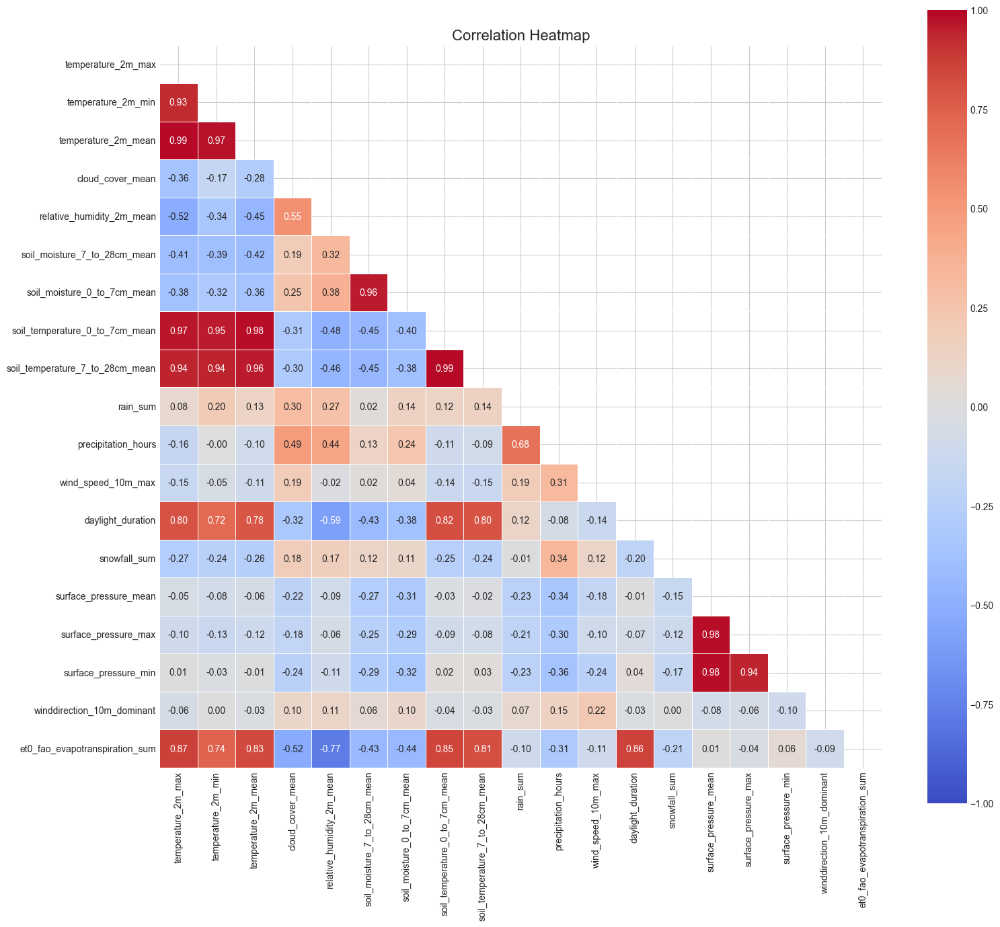

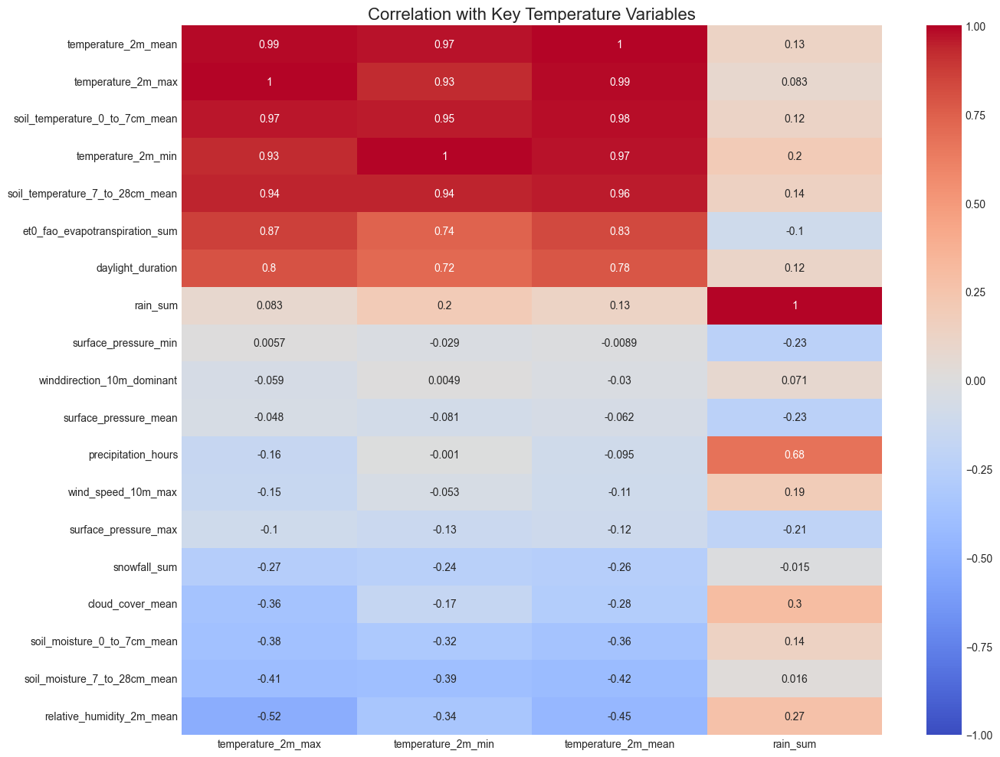

In [4]:
# Calculate correlations
corr = df[numeric_cols].corr()

# --- Create textual summary for LLM ---
summary_text = "### Correlation Summary for Numeric Columns ###\n\n"

# Flatten the correlation matrix and get unique pairs (upper triangle only)
for i, col1 in enumerate(corr.columns):
    for j, col2 in enumerate(corr.columns):
        if j > i:  # avoid duplicates & self-correlations
            summary_text += f"{col1} vs {col2}: {corr.iloc[i, j]:.3f}\n"

summary_text += "\n### Top Correlations with Key Temperature Variables ###\n"

# Focused summary for key temperature variables
target_vars = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean', 'rain_sum']
for var in target_vars:
    if var in corr.columns:
        sorted_corrs = corr[var].sort_values(ascending=False)
        summary_text += f"\n{var} correlations:\n"
        for other_var, value in sorted_corrs.items():
            if other_var != var:
                summary_text += f"  {other_var}: {value:.3f}\n"

# Print summary for LLM
print(summary_text)

# --- Plot full correlation heatmap ---
plt.figure(figsize=(16, 14))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='coolwarm',
            vmin=-1, vmax=1, square=True, linewidths=0.5)
plt.title("Correlation Heatmap", fontsize=16)
plt.tight_layout()
plt.show()

# --- Plot focused heatmap for target variables ---
plt.figure(figsize=(14, 10))
sns.heatmap(corr[target_vars].sort_values(by='temperature_2m_mean', ascending=False),
            annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation with Key Temperature Variables", fontsize=16)
plt.tight_layout()
plt.show()

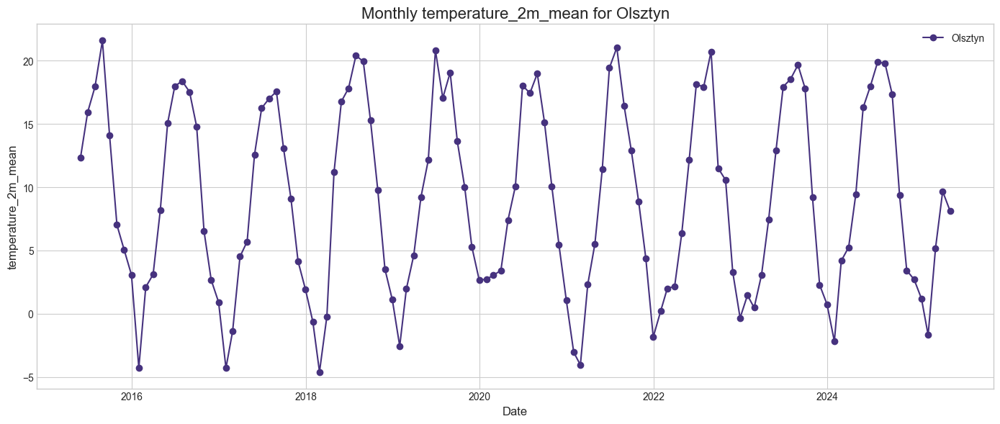

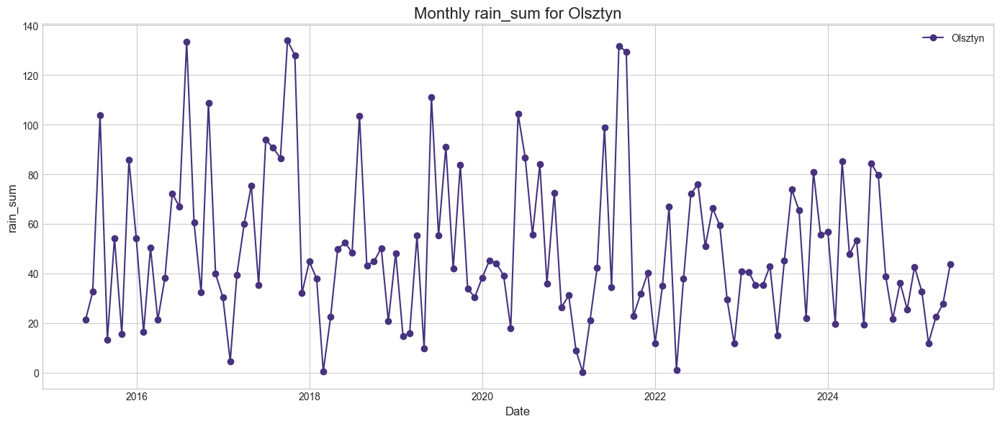

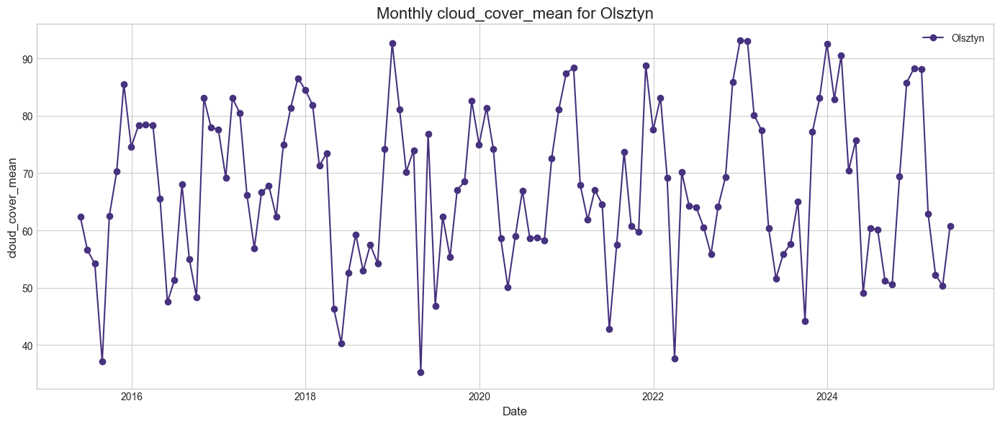

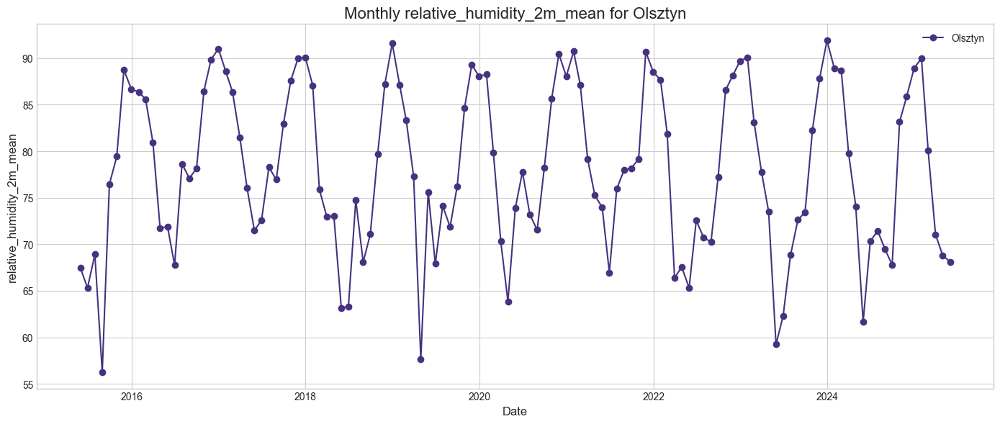

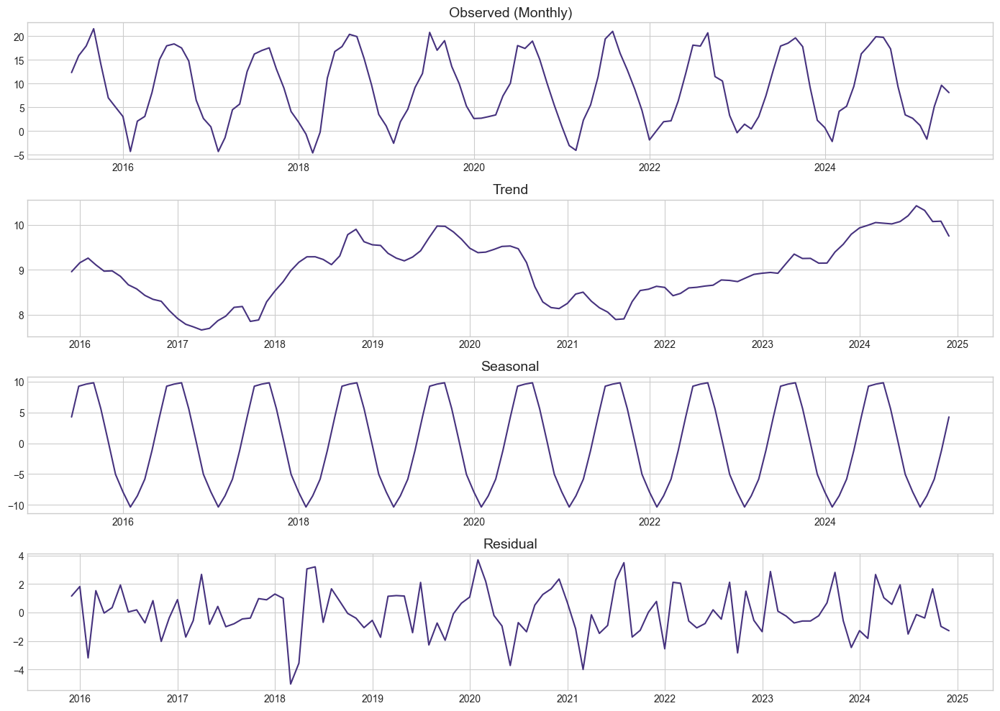

### Monthly Summary for Olsztyn ###

temperature_2m_mean:
  Count: 121
  Mean: 8.998
  Std Dev: 7.418
  Min: -4.590
  25%: 2.711
  Median: 9.106
  75%: 16.401
  Max: 21.578

rain_sum:
  Count: 121
  Mean: 49.633
  Std Dev: 30.940
  Min: 0.300
  25%: 29.600
  Median: 42.700
  75%: 66.900
  Max: 133.900

cloud_cover_mean:
  Count: 121
  Mean: 67.491
  Std Dev: 13.746
  Min: 35.294
  25%: 57.638
  Median: 67.049
  75%: 78.403
  Max: 93.125

relative_humidity_2m_mean:
  Count: 121
  Mean: 77.998
  Std Dev: 8.841
  Min: 56.289
  25%: 71.477
  Median: 77.791
  75%: 86.686
  Max: 91.885

### Seasonal Decomposition (Temperature) ###

Trend mean: 8.978
Trend min: 7.662
Trend max: 10.427
Seasonality amplitude: 20.184



In [5]:
# --- Select ONE city ---
city = "Olsztyn"  # Change to the city you want
city_data = df[df['city'] == city].copy()

# --- Convert date column to datetime ---
city_data['date'] = pd.to_datetime(city_data['date'])
city_data.set_index('date', inplace=True)

# --- Resample to monthly data ---
city_data_monthly = city_data.resample('M').agg({
    'temperature_2m_mean': 'mean',
    'rain_sum': 'sum',  # rainfall is cumulative, so use sum
    'cloud_cover_mean': 'mean',
    'relative_humidity_2m_mean': 'mean'
})

# --- Create summary text for LLM ---
summary_text = f"### Monthly Summary for {city} ###\n\n"

# Describe each variable
for var in city_data_monthly.columns:
    stats = city_data_monthly[var].describe()
    summary_text += (
        f"{var}:\n"
        f"  Count: {stats['count']:.0f}\n"
        f"  Mean: {stats['mean']:.3f}\n"
        f"  Std Dev: {stats['std']:.3f}\n"
        f"  Min: {stats['min']:.3f}\n"
        f"  25%: {stats['25%']:.3f}\n"
        f"  Median: {stats['50%']:.3f}\n"
        f"  75%: {stats['75%']:.3f}\n"
        f"  Max: {stats['max']:.3f}\n\n"
    )

# --- Plot monthly data ---
key_variables = ['temperature_2m_mean', 'rain_sum', 'cloud_cover_mean', 'relative_humidity_2m_mean']

for var in key_variables:
    plt.figure(figsize=(14, 6))
    plt.plot(city_data_monthly.index, city_data_monthly[var], marker='o', label=city)
    plt.title(f'Monthly {var} for {city}', fontsize=16)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel(var, fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# --- Seasonal Decomposition on MONTHLY data ---
if len(city_data_monthly) >= 24:  # need enough data points
    decomposition = seasonal_decompose(city_data_monthly['temperature_2m_mean'], 
                                       model='additive', period=12)

    summary_text += "### Seasonal Decomposition (Temperature) ###\n\n"
    summary_text += (
        f"Trend mean: {decomposition.trend.mean():.3f}\n"
        f"Trend min: {decomposition.trend.min():.3f}\n"
        f"Trend max: {decomposition.trend.max():.3f}\n"
        f"Seasonality amplitude: {decomposition.seasonal.max() - decomposition.seasonal.min():.3f}\n"
    )

    plt.figure(figsize=(14, 10))
    plt.subplot(4, 1, 1)
    plt.plot(decomposition.observed)
    plt.title('Observed (Monthly)', fontsize=14)

    plt.subplot(4, 1, 2)
    plt.plot(decomposition.trend)
    plt.title('Trend', fontsize=14)

    plt.subplot(4, 1, 3)
    plt.plot(decomposition.seasonal)
    plt.title('Seasonal', fontsize=14)

    plt.subplot(4, 1, 4)
    plt.plot(decomposition.resid)
    plt.title('Residual', fontsize=14)

    plt.tight_layout()
    plt.show()
else:
    summary_text += "Not enough monthly data for seasonal decomposition.\n"
    print("Not enough monthly data for seasonal decomposition.")

# --- Print or return summary text for LLM ---
print(summary_text)

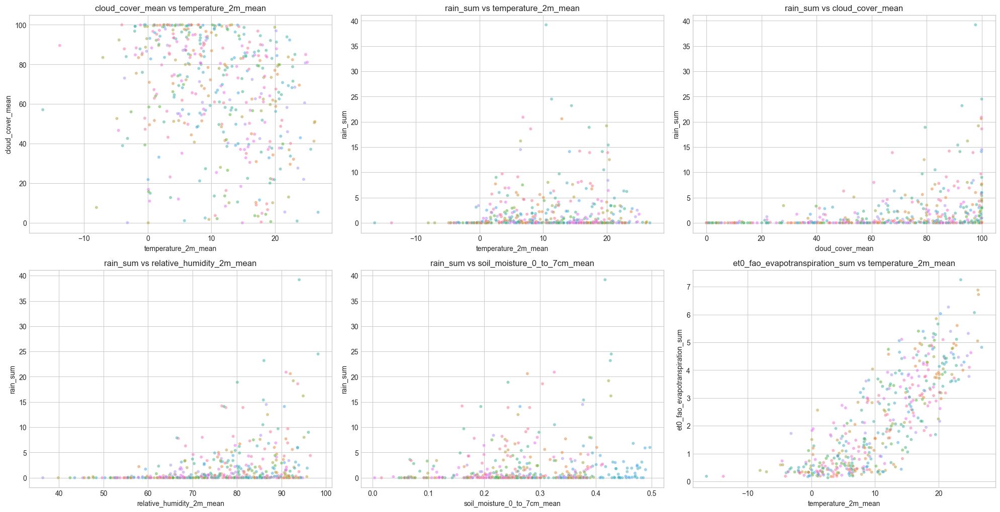

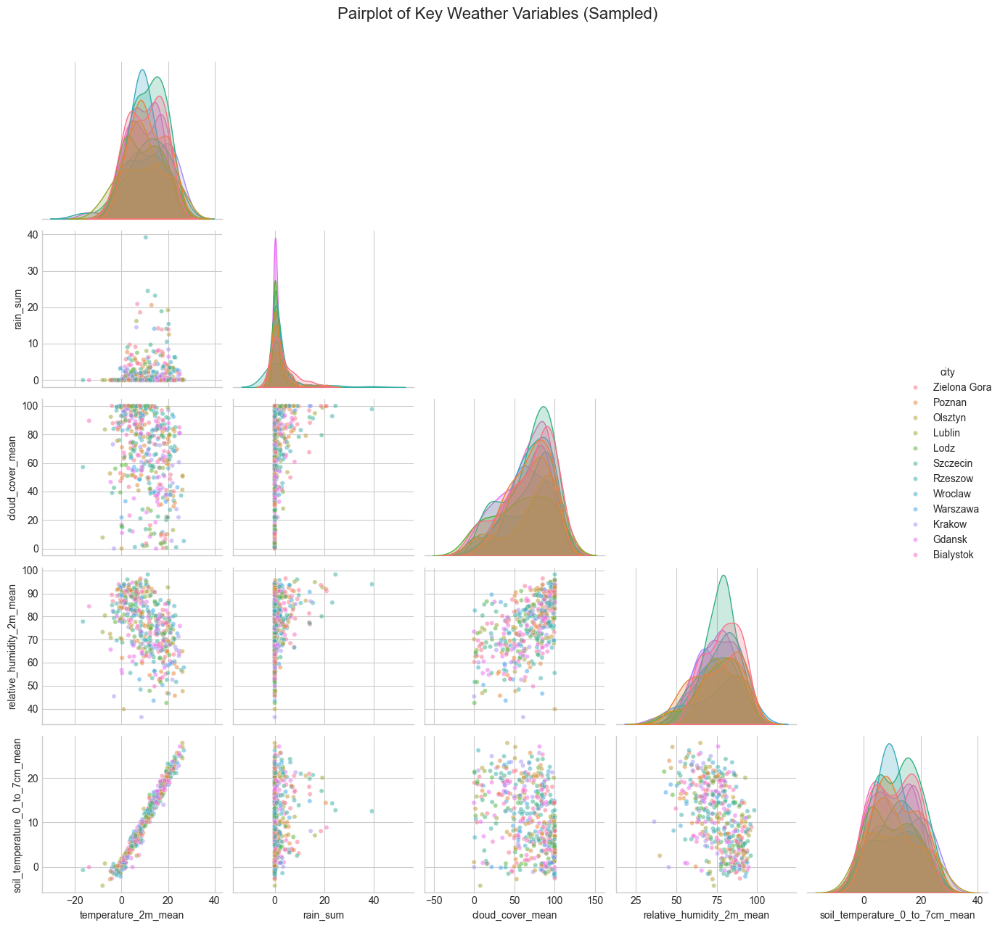

### Sampled Data Summary (1% of rows) ###

Numeric Columns Summary:
temperature_2m_max:
  Count: 438
  Mean: 14.336
  Std Dev: 8.846
  Min: -14.013
  25%: 7.394
  Median: 14.253
  75%: 21.442
  Max: 34.172

temperature_2m_min:
  Count: 438
  Mean: 6.656
  Std Dev: 6.992
  Min: -19.564
  25%: 1.615
  Median: 6.518
  75%: 12.351
  Max: 21.020

temperature_2m_mean:
  Count: 438
  Mean: 10.558
  Std Dev: 7.772
  Min: -16.495
  25%: 4.752
  Median: 10.487
  75%: 17.043
  Max: 26.780

cloud_cover_mean:
  Count: 438
  Mean: 67.084
  Std Dev: 28.052
  Min: 0.000
  25%: 49.760
  Median: 73.917
  75%: 90.271
  Max: 100.000

relative_humidity_2m_mean:
  Count: 438
  Mean: 76.046
  Std Dev: 12.201
  Min: 36.360
  25%: 67.817
  Median: 77.509
  75%: 85.826
  Max: 98.244

soil_moisture_7_to_28cm_mean:
  Count: 438
  Mean: 0.267
  Std Dev: 0.104
  Min: 0.034
  25%: 0.197
  Median: 0.257
  75%: 0.351
  Max: 0.491

soil_moisture_0_to_7cm_mean:
  Count: 438
  Mean: 0.276
  Std Dev: 0.104
  Min: 0.003
  

In [6]:
# --- SAMPLE DATA TO REDUCE DOTS ---
df_sample = df.sample(frac=0.01, random_state=42)  # use 1% of the rows

# --- Create summary text for LLM ---
summary_text = "### Sampled Data Summary (1% of rows) ###\n\n"

# Numeric summary
numeric_cols_sample = df_sample.select_dtypes(include='number').columns
summary_text += "Numeric Columns Summary:\n"
for col in numeric_cols_sample:
    stats = df_sample[col].describe()
    summary_text += (
        f"{col}:\n"
        f"  Count: {stats['count']:.0f}\n"
        f"  Mean: {stats['mean']:.3f}\n"
        f"  Std Dev: {stats['std']:.3f}\n"
        f"  Min: {stats['min']:.3f}\n"
        f"  25%: {stats['25%']:.3f}\n"
        f"  Median: {stats['50%']:.3f}\n"
        f"  75%: {stats['75%']:.3f}\n"
        f"  Max: {stats['max']:.3f}\n\n"
    )

# Pairwise correlations for selected variables
main_vars = ['temperature_2m_mean', 'rain_sum', 'cloud_cover_mean', 
             'relative_humidity_2m_mean', 'soil_temperature_0_to_7cm_mean']
corr_matrix = df_sample[main_vars].corr()
summary_text += "### Pairwise Correlations of Main Variables (Sample) ###\n"
for i, var1 in enumerate(main_vars):
    for j, var2 in enumerate(main_vars):
        if j > i:
            summary_text += f"{var1} vs {var2}: {corr_matrix.loc[var1, var2]:.3f}\n"
summary_text += "\n"

# --- Plot scatter plots for selected pairs ---
fig = plt.figure(figsize=(20, 15))
plot_pairs = [
    ('temperature_2m_mean', 'cloud_cover_mean'),
    ('temperature_2m_mean', 'rain_sum'),
    ('cloud_cover_mean', 'rain_sum'),
    ('relative_humidity_2m_mean', 'rain_sum'),
    ('soil_moisture_0_to_7cm_mean', 'rain_sum'),
    ('temperature_2m_mean', 'et0_fao_evapotranspiration_sum')
]

for i, (x, y) in enumerate(plot_pairs, 1):
    ax = fig.add_subplot(3, 3, i)
    sns.scatterplot(x=df_sample[x], y=df_sample[y], hue=df_sample['city'], alpha=0.5, s=20, ax=ax)
    ax.set_title(f'{y} vs {x}')
    ax.legend([], [], frameon=False)

plt.tight_layout()
plt.show()

# --- Pairplot with sampled data ---
sns.pairplot(df_sample[main_vars + ['city']], hue='city', height=2.5, corner=True, plot_kws={'alpha':0.5, 's':20})
plt.suptitle('Pairplot of Key Weather Variables (Sampled)', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

# --- Print summary for LLM ---
print(summary_text)

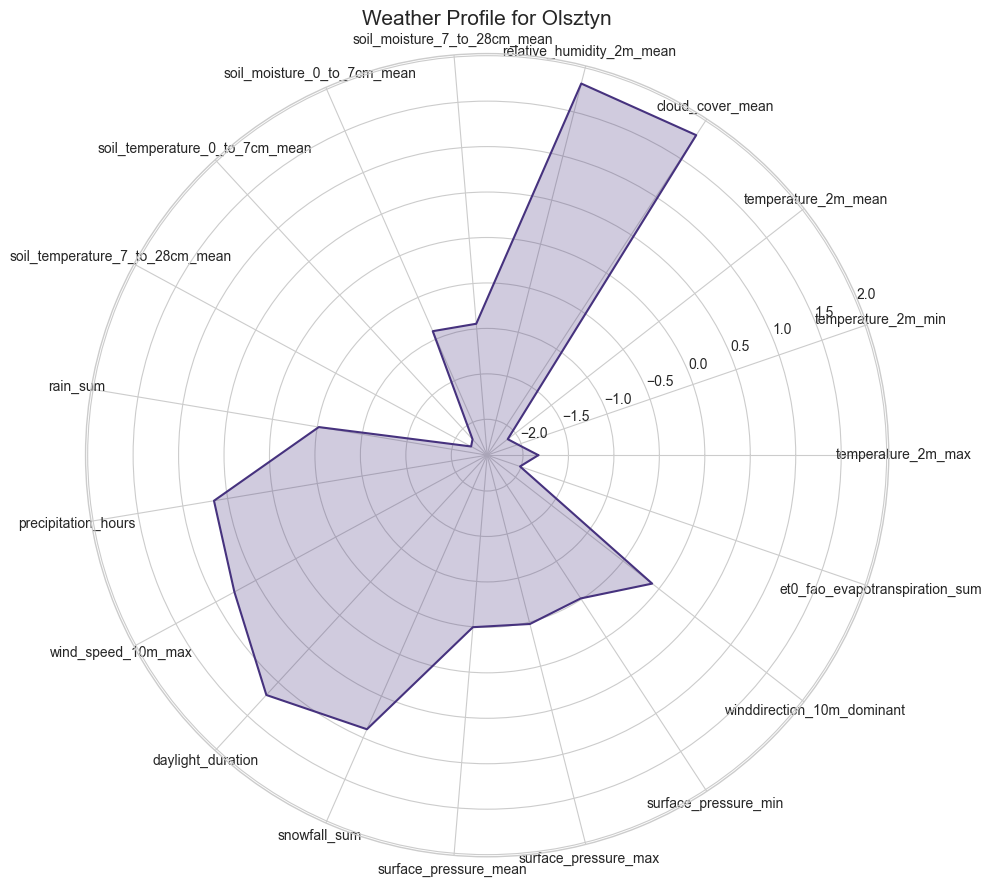

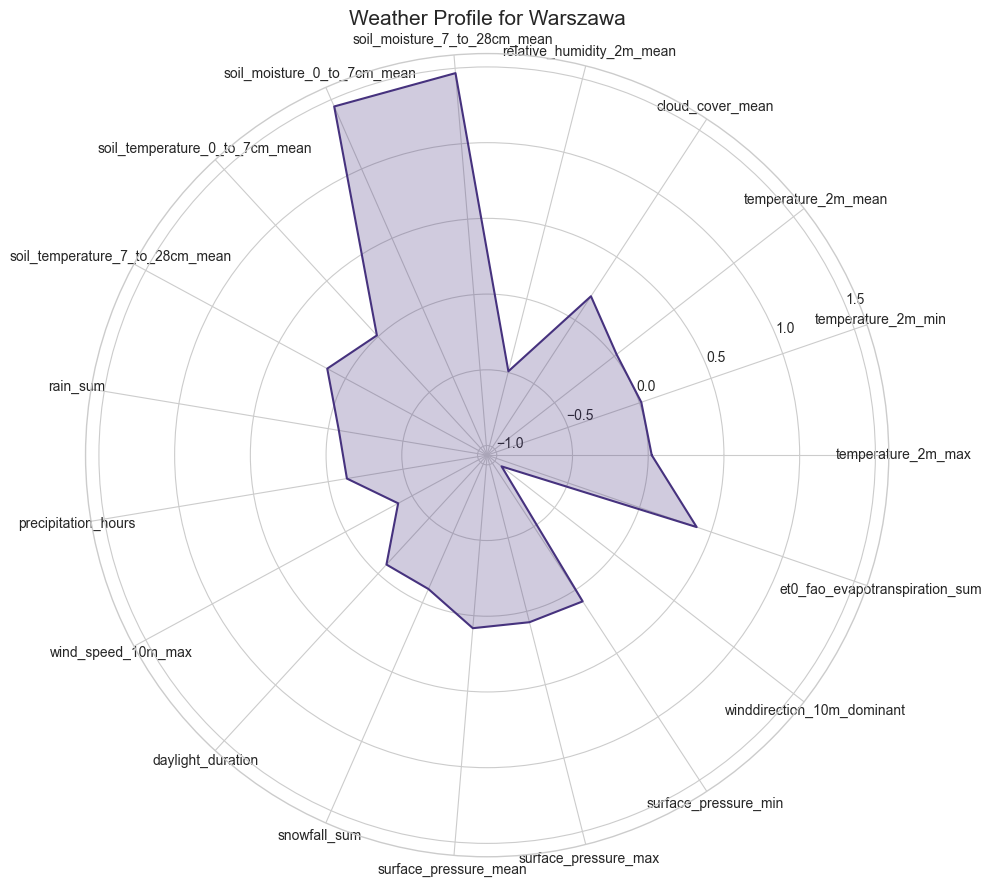

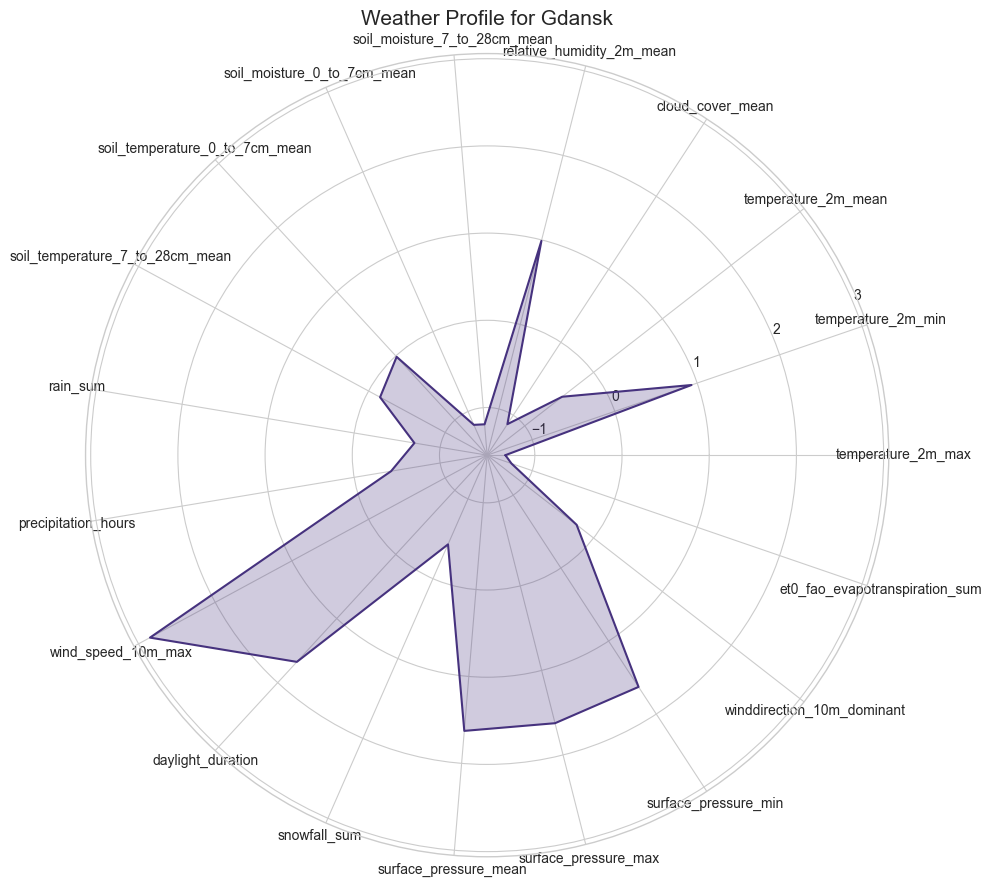

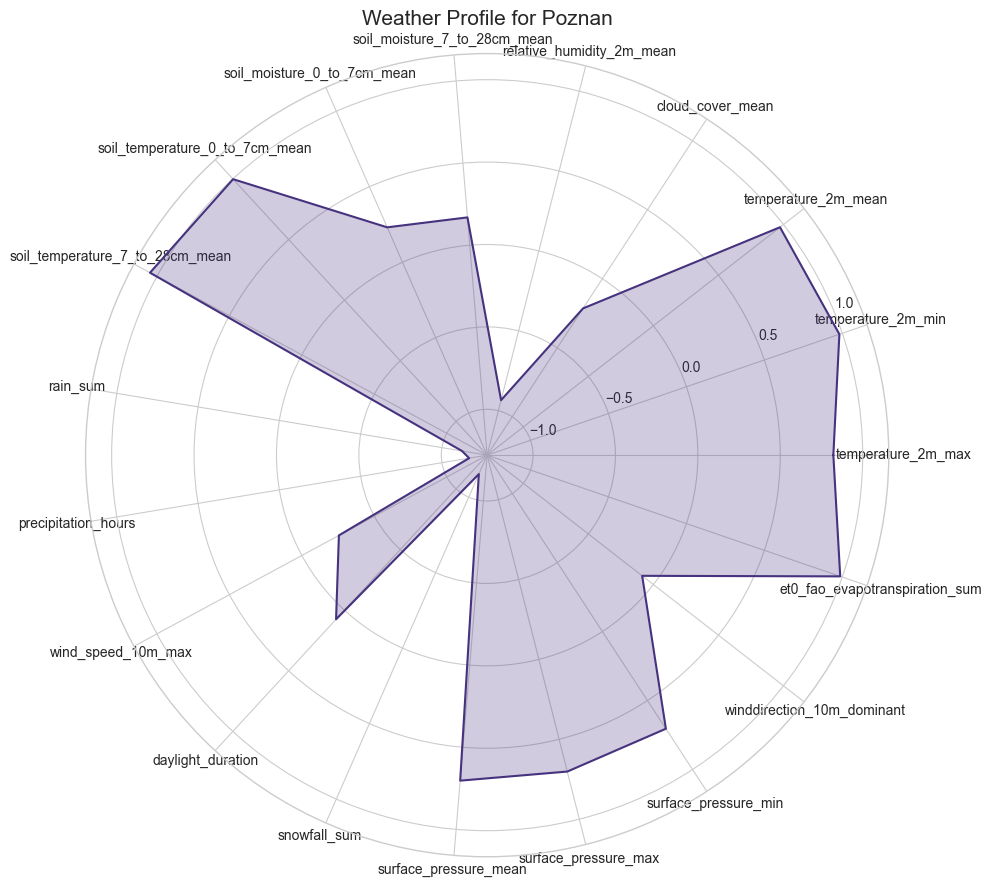

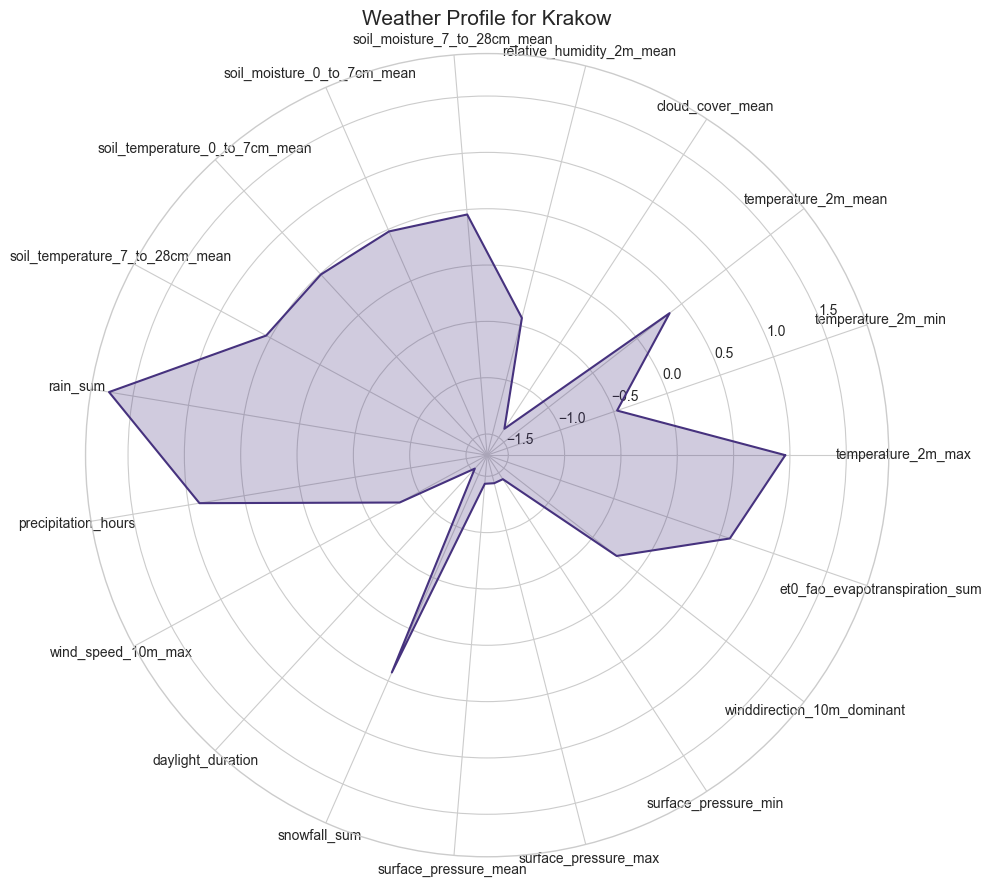

...

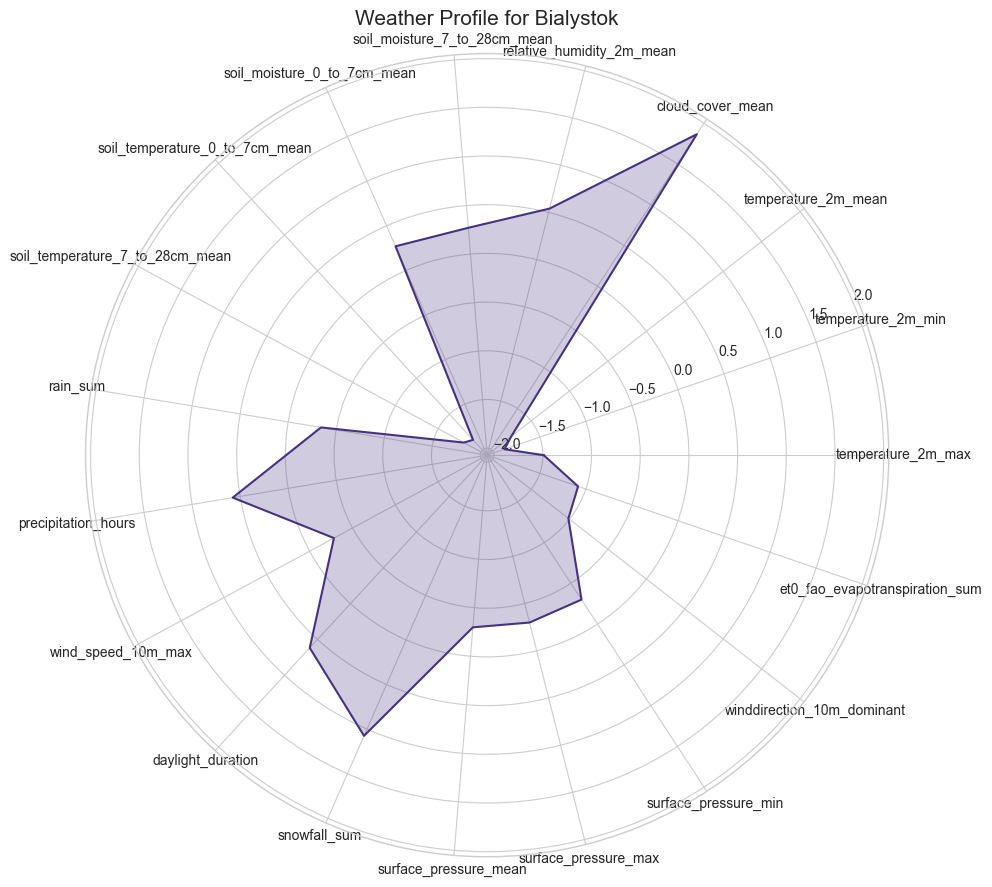

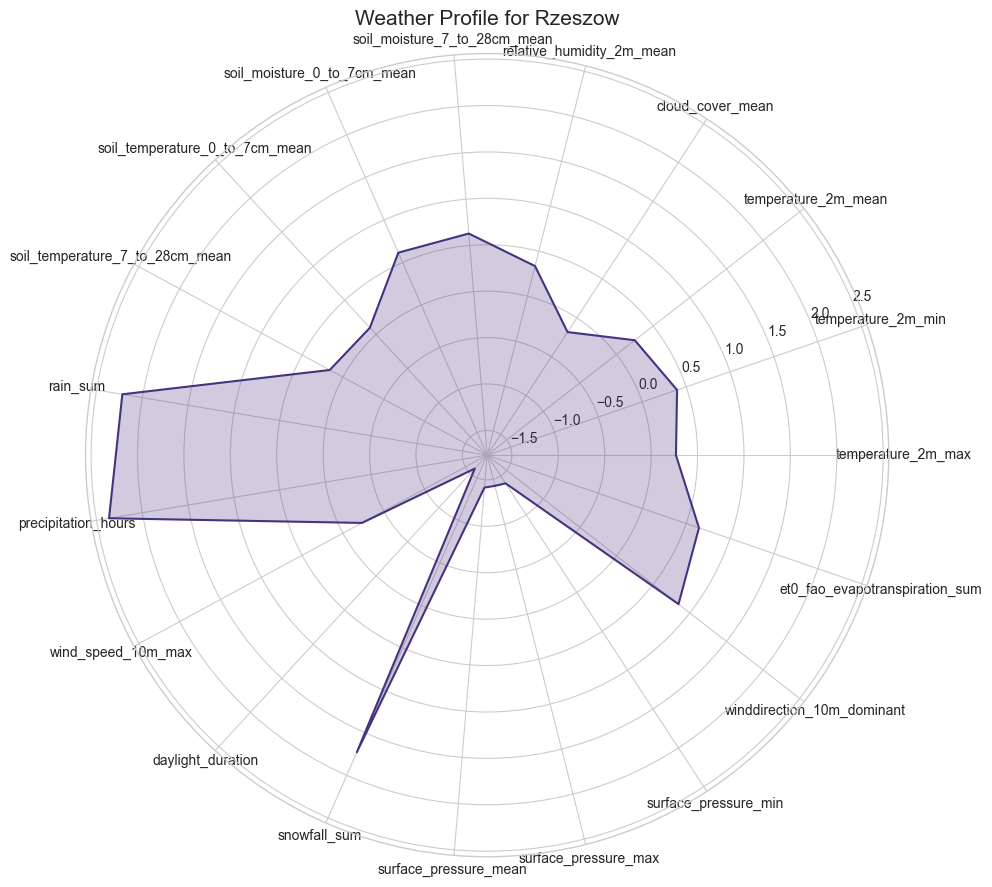

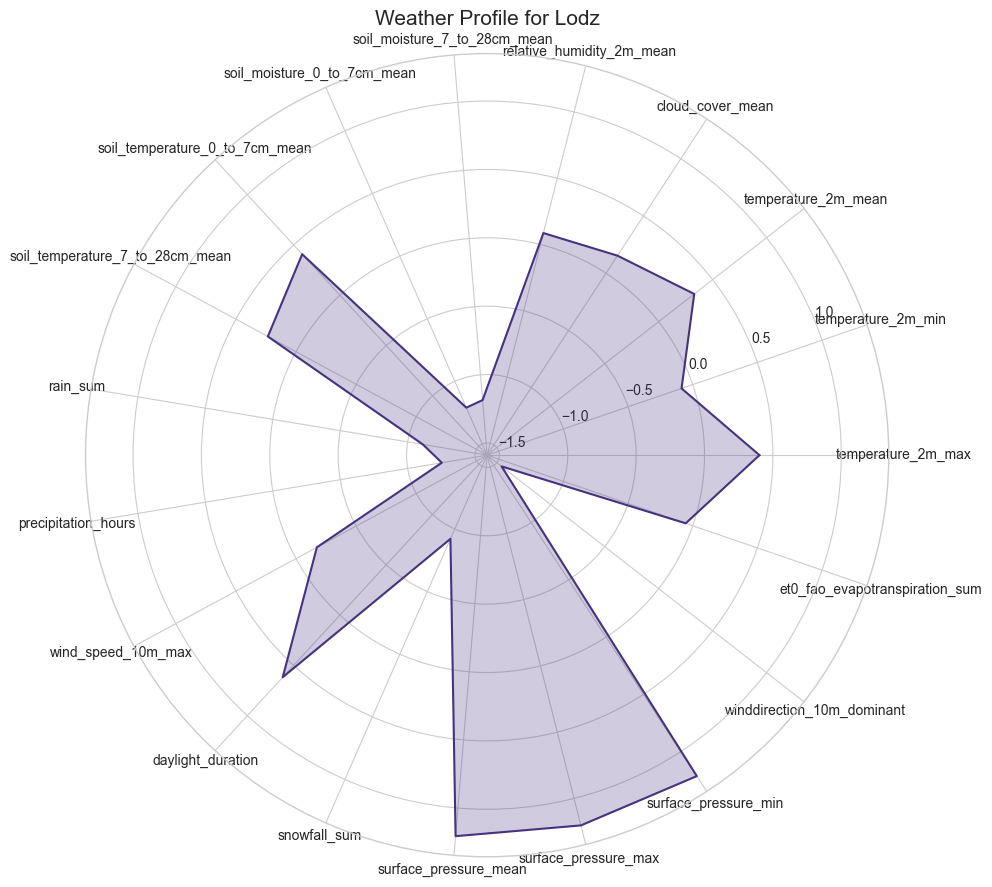

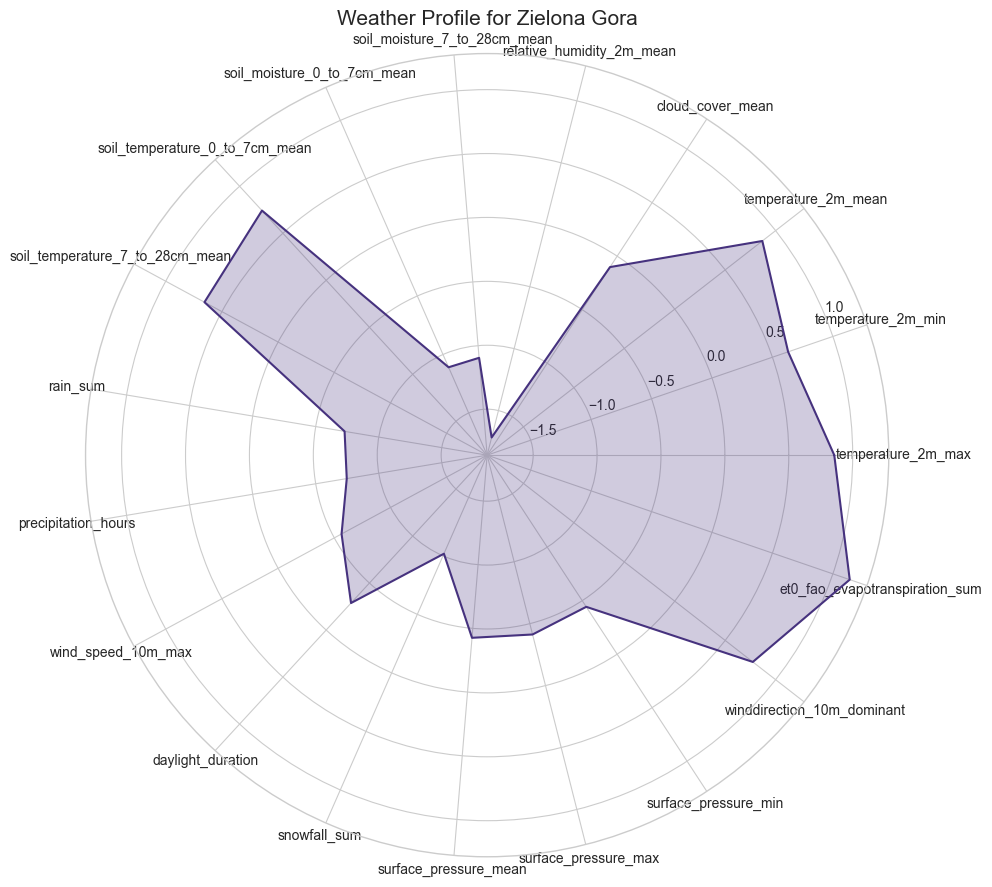

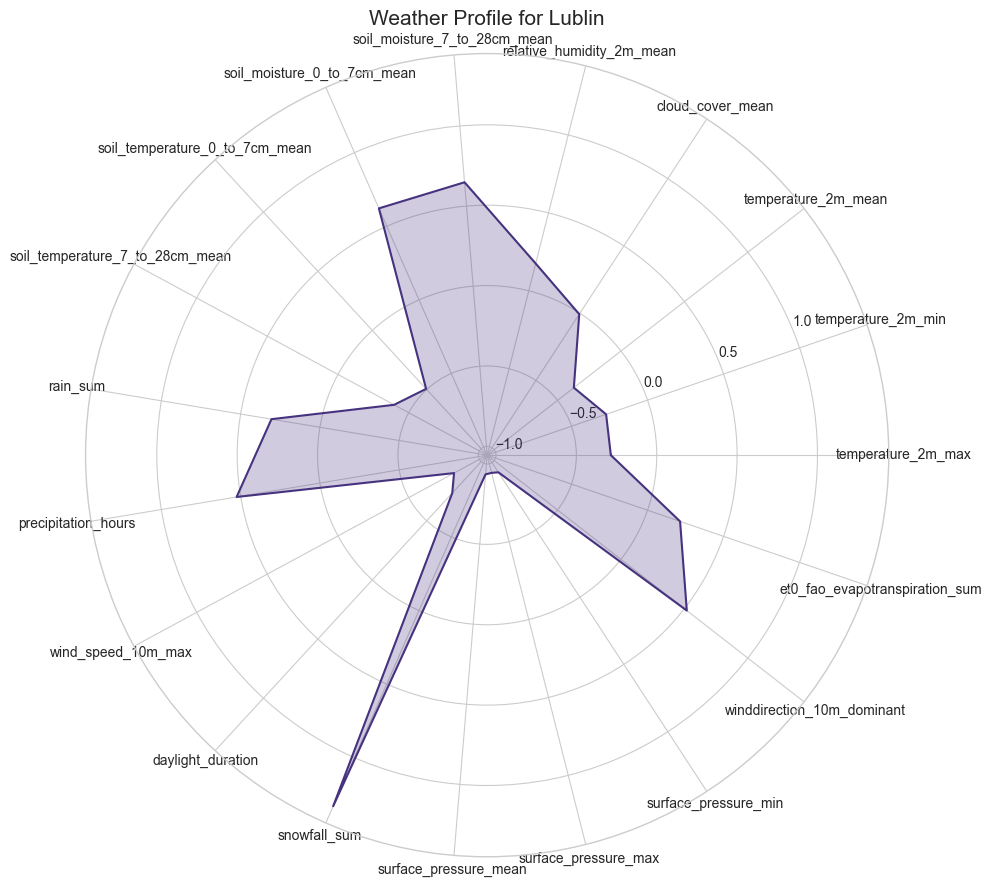

### City-Level Weather Profiles ###

City: Olsztyn
  temperature_2m_max mean: 12.687
  temperature_2m_min mean: 5.375
  rain_sum mean: 1.644
  cloud_cover_mean mean: 67.528
  relative_humidity_2m_mean mean: 78.067

City: Warszawa
  temperature_2m_max mean: 13.912
  temperature_2m_min mean: 6.291
  rain_sum mean: 1.700
  cloud_cover_mean mean: 66.139
  relative_humidity_2m_mean mean: 75.155

City: Gdansk
  temperature_2m_max mean: 13.013
  temperature_2m_min mean: 6.702
  rain_sum mean: 1.620
  cloud_cover_mean mean: 65.015
  relative_humidity_2m_mean mean: 77.017

City: Poznan
  temperature_2m_max mean: 14.440
  temperature_2m_min mean: 6.724
  rain_sum mean: 1.567
  cloud_cover_mean mean: 65.793
  relative_humidity_2m_mean mean: 74.599

City: Krakow
  temperature_2m_max mean: 14.530
  temperature_2m_min mean: 6.076
  rain_sum mean: 1.924
  cloud_cover_mean mean: 64.771
  relative_humidity_2m_mean mean: 75.231

City: Wroclaw
  temperature_2m_max mean: 14.818
  temperature_2m_min mean: 

In [7]:
# --- Compare distributions of key variables across cities ---
key_vars_to_compare = ['temperature_2m_max', 'temperature_2m_min', 'rain_sum', 
                       'cloud_cover_mean', 'relative_humidity_2m_mean']

cities = df['city'].unique()

# Calculate means by city
city_means = df.groupby('city')[numeric_cols].mean()

# Normalize for radar chart
scaler = StandardScaler()
city_means_scaled = pd.DataFrame(
    scaler.fit_transform(city_means),
    columns=city_means.columns,
    index=city_means.index
)

# --- Create summary text for LLM ---
summary_text = "### City-Level Weather Profiles ###\n\n"

for city in cities:
    summary_text += f"City: {city}\n"
    for var in key_vars_to_compare:
        if var in city_means.columns:
            summary_text += f"  {var} mean: {city_means.loc[city, var]:.3f}\n"
    summary_text += "\n"

summary_text += "### Inter-City Comparisons (Key Variables) ###\n"
for var in key_vars_to_compare:
    if var in city_means.columns:
        sorted_means = city_means[var].sort_values(ascending=False)
        summary_text += f"{var} ranking (highest to lowest): {', '.join([f'{c}: {v:.2f}' for c, v in sorted_means.items()])}\n"
summary_text += "\n"

# --- Radar charts for each city ---
for city in cities:
    categories = numeric_cols
    values = city_means_scaled.loc[city].values.tolist()
    values.append(values[0])  # Close the loop
    
    angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False).tolist()
    angles.append(angles[0])  # Close the loop
    
    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))
    ax.plot(angles, values)
    ax.fill(angles, values, alpha=0.25)
    ax.set_thetagrids(np.degrees(angles[:-1]), categories)
    ax.set_title(f'Weather Profile for {city}', fontsize=15)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

# --- Print summary for LLM ---
print(summary_text)

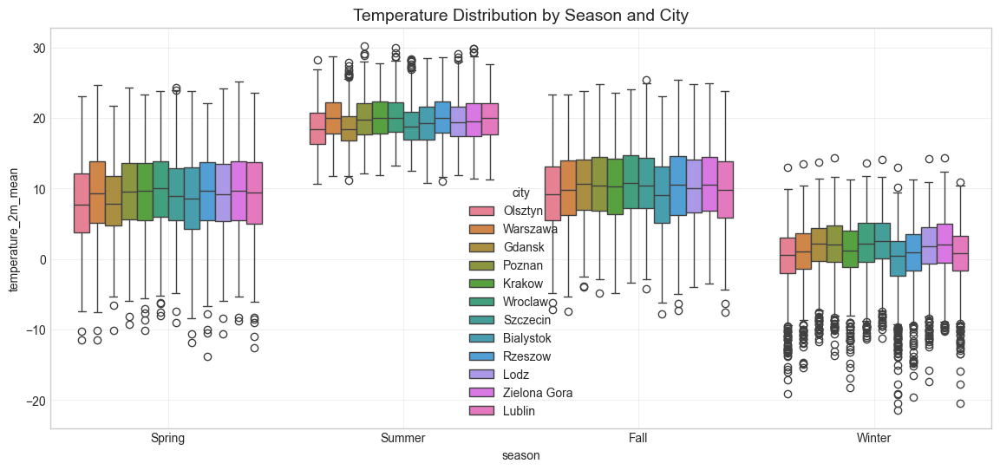

In [8]:
# Add some derived features that might be useful for modeling
df['temp_range'] = df['temperature_2m_max'] - df['temperature_2m_min']
df['soil_temp_diff'] = df['soil_temperature_0_to_7cm_mean'] - df['soil_temperature_7_to_28cm_mean']
df['pressure_change'] = df['surface_pressure_max'] - df['surface_pressure_min']
df['month'] = df['date'].dt.month
df['day_of_year'] = df['date'].dt.dayofyear
df['season'] = df['month'].apply(lambda x: 'Winter' if x in [12, 1, 2] else 
                                   'Spring' if x in [3, 4, 5] else
                                   'Summer' if x in [6, 7, 8] else 'Fall')

# Visualize some of these derived features
plt.figure(figsize=(14, 6))
sns.boxplot(x='season', y='temperature_2m_mean', data=df, hue='city')
plt.title('Temperature Distribution by Season and City', fontsize=14)
plt.grid(True, alpha=0.3)
plt.show()


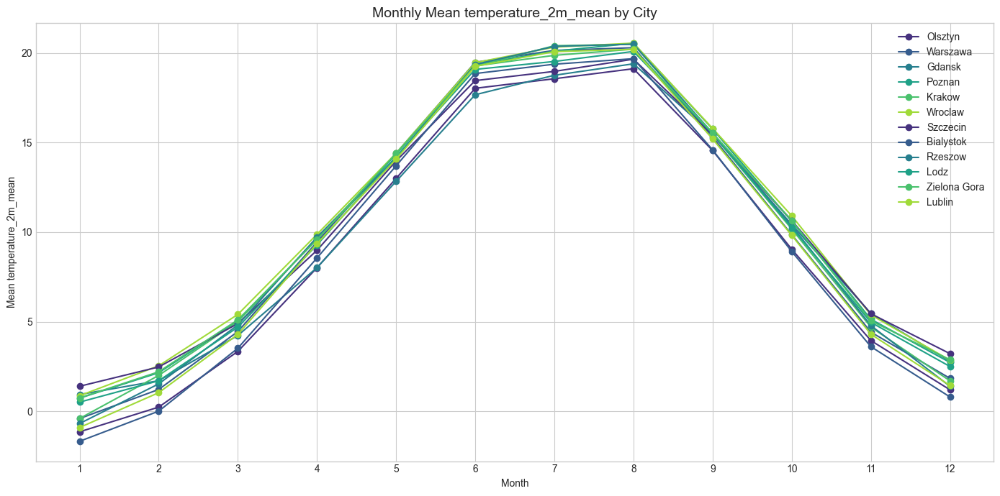

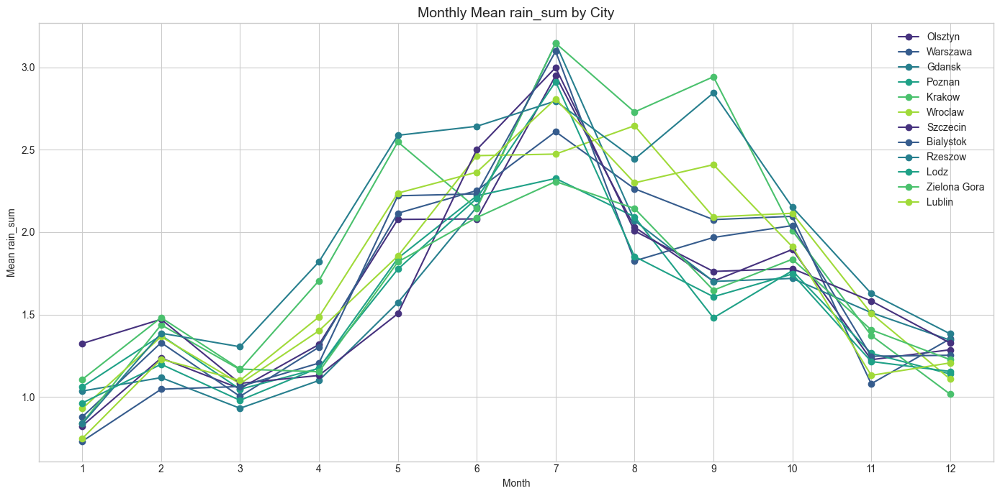

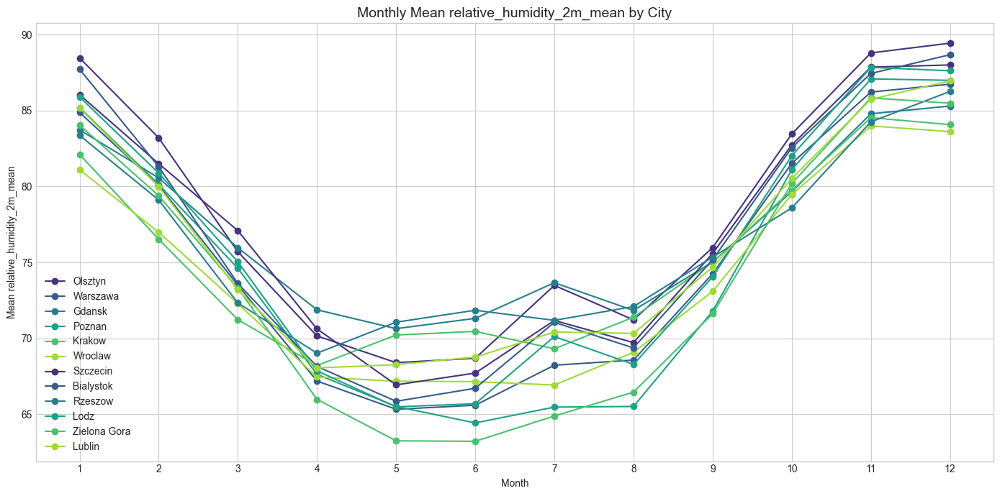

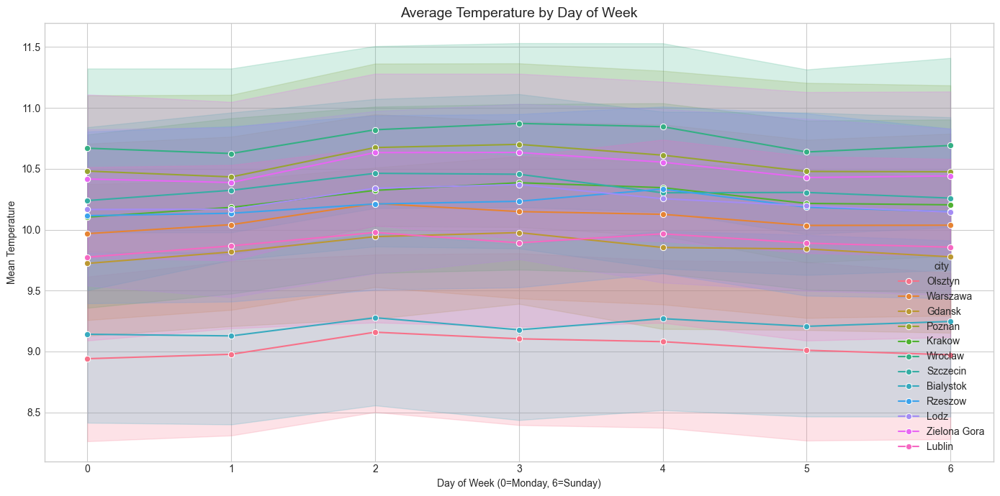

### Monthly and Weekly Weather Summary ###

City: Olsztyn
  temperature_2m_max:
    Month 01: mean=0.934, std=4.279, min=-15.178, max=10.772
    Month 02: mean=3.164, std=4.677, min=-11.978, max=13.922
    Month 03: mean=7.609, std=4.379, min=-7.378, max=21.172
    Month 04: mean=12.887, std=5.043, min=2.522, max=26.622
    Month 05: mean=17.806, std=4.669, min=5.222, max=28.772
    Month 06: mean=22.682, std=3.904, min=14.379, max=32.172
    Month 07: mean=22.820, std=3.743, min=14.972, max=32.779
    Month 08: mean=23.779, std=4.013, min=14.872, max=33.728
    Month 09: mean=18.803, std=4.200, min=10.572, max=29.822
    Month 10: mean=12.305, std=3.824, min=4.072, max=23.572
    Month 11: mean=5.951, std=4.005, min=-4.578, max=15.822
    Month 12: mean=2.964, std=3.655, min=-7.028, max=14.422
  temperature_2m_min:
    Month 01: mean=-3.433, std=5.134, min=-23.078, max=8.322
    Month 02: mean=-2.404, std=4.779, min=-19.678, max=6.322
    Month 03: mean=-0.454, std=3.762, min=-16.028,

In [9]:
# --- Add time-based features ---
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['week'] = df['date'].dt.isocalendar().week
df['dayofweek'] = df['date'].dt.dayofweek

# --- Monthly statistics ---
monthly_stats = df.groupby(['city', 'month'])[target_vars].agg(['mean', 'std', 'min', 'max'])

# --- Create summary text for LLM ---
summary_text = "### Monthly and Weekly Weather Summary ###\n\n"

# Add per-city monthly summaries
for city in cities:
    summary_text += f"City: {city}\n"
    for var in target_vars:
        if var in df.columns:
            city_monthly = monthly_stats.loc[city, var]
            summary_text += f"  {var}:\n"
            for month in range(1, 13):
                if month in city_monthly.index:
                    m = city_monthly.loc[month]
                    summary_text += (
                        f"    Month {month:02d}: "
                        f"mean={m['mean']:.3f}, std={m['std']:.3f}, min={m['min']:.3f}, max={m['max']:.3f}\n"
                    )
    summary_text += "\n"

# Weekly patterns
weekly_means = df.groupby(['city', 'dayofweek'])['temperature_2m_mean'].mean()
summary_text += "### Weekly Temperature Patterns ###\n"
for city in cities:
    summary_text += f"{city}: "
    city_weekly = weekly_means.loc[city]
    summary_text += ", ".join([f"D{dow}={val:.2f}" for dow, val in city_weekly.items()]) + "\n"

# --- Plot monthly patterns ---
for var in ['temperature_2m_mean', 'rain_sum', 'relative_humidity_2m_mean']:
    plt.figure(figsize=(14, 7))
    for city in cities:
        monthly_means = df[df['city'] == city].groupby('month')[var].mean()
        plt.plot(monthly_means.index, monthly_means.values, marker='o', label=city)
    
    plt.title(f'Monthly Mean {var} by City', fontsize=14)
    plt.xlabel('Month')
    plt.ylabel(f'Mean {var}')
    plt.grid(True)
    plt.legend()
    plt.xticks(range(1, 13))
    plt.tight_layout()
    plt.show()

# --- Weekly patterns visualization ---
plt.figure(figsize=(14, 7))
sns.lineplot(data=df, x='dayofweek', y='temperature_2m_mean', hue='city', marker='o')
plt.title('Average Temperature by Day of Week', fontsize=14)
plt.xlabel('Day of Week (0=Monday, 6=Sunday)')
plt.ylabel('Mean Temperature')
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Print summary text for LLM ---
print(summary_text)

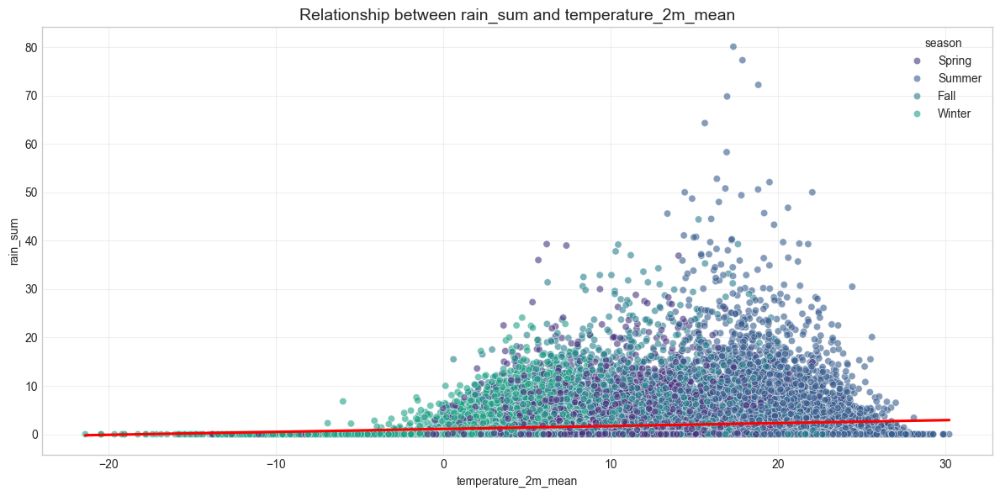

Correlation between temperature_2m_mean and rain_sum: 0.1307

Statistics by season groups:


temperature_2m_mean            rain_sum          
                      mean       std      mean       std
season                                                  
Fall             10.083260  5.558104  1.764844  3.744791
Spring            9.242915  5.523436  1.477262  2.990727
Summer           19.578466  3.113028  2.426975  5.154585
Winter            1.220526  4.281217  1.155639  2.283142

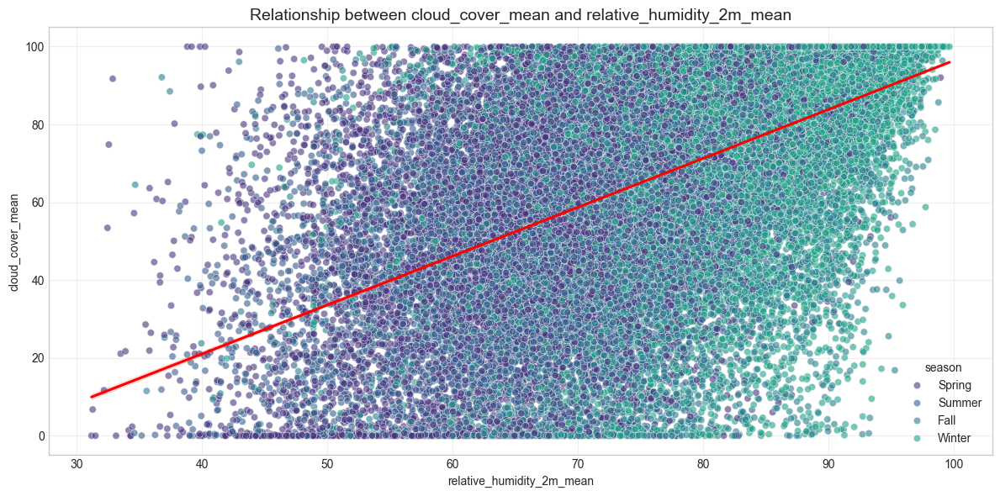

Correlation between relative_humidity_2m_mean and cloud_cover_mean: 0.5456

Statistics by season groups:


relative_humidity_2m_mean            cloud_cover_mean           
                            mean        std             mean        std
season                                                                 
Fall                   80.496604   9.573064        68.185550  27.718247
Spring                 69.959215  11.489983        61.284274  28.478452
Summer                 68.935544  10.268531        56.432163  25.224894
Winter                 83.912506   8.961571        78.260405  24.118941

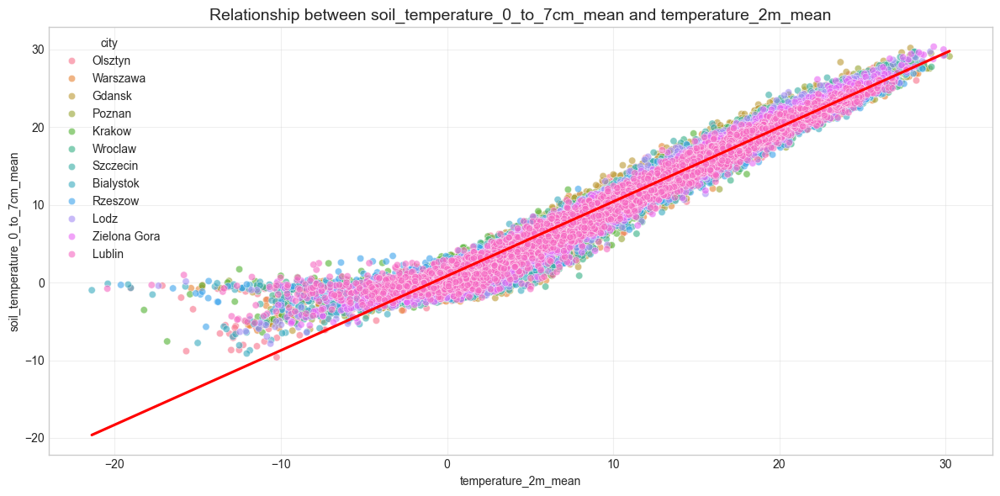

Correlation between temperature_2m_mean and soil_temperature_0_to_7cm_mean: 0.9818

Statistics by city groups:


temperature_2m_mean           soil_temperature_0_to_7cm_mean  \
                            mean       std                           mean   
city                                                                        
Bialystok               9.206874  8.522533                       9.678531   
Gdansk                  9.847565  7.359318                      10.483205   
Krakow                 10.251513  8.199627                      10.704096   
Lodz                   10.234130  7.893287                      10.667366   
Lublin                  9.889147  8.392903                      10.273587   
Olsztyn                 9.034918  8.091189                       9.547900   
Poznan                 10.550802  7.928048                      10.924800   
Rzeszow                10.194402  8.371217                      10.532508   
Szczecin               10.335552  7.385009                      10.772674   
Warszawa               10.081605  8.305676                      10.494341   
Wroclaw                10.737391  7.877987                      10.980472   
Zielona Gora           10.499203  7.888637                      10.812834   

                        
                   std  
city                    
Bialystok     8.047160  
Gdansk        7.612774  
Krakow        7.937886  
Lodz          7.937075  
Lublin        7.802620  
Olsztyn       7.853614  
Poznan        7.878976  
Rzeszow       7.778013  
Szczecin      7.528476  
Warszawa      8.011795  
Wroclaw       7.692162  
Zielona Gora  7.827059

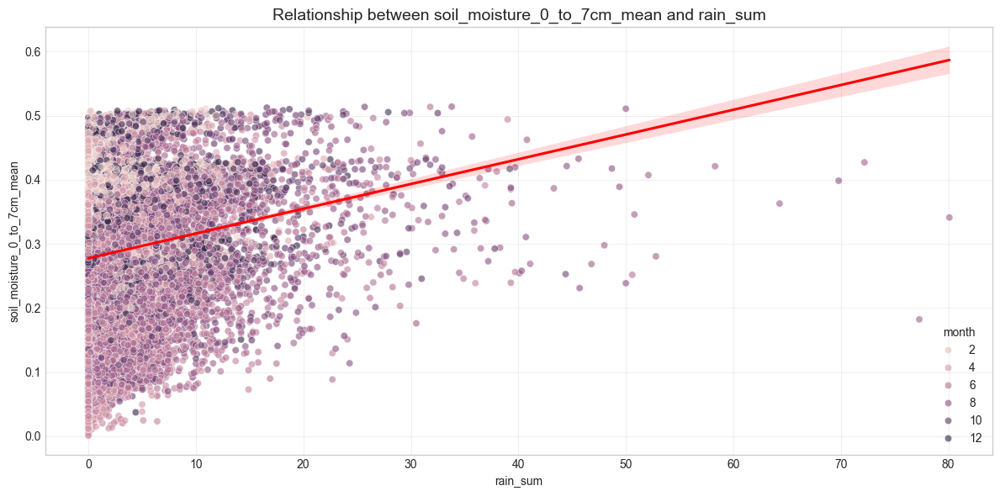

Correlation between rain_sum and soil_moisture_0_to_7cm_mean: 0.1382

Statistics by month groups:


rain_sum           soil_moisture_0_to_7cm_mean          
           mean       std                        mean       std
month                                                          
1      0.940269  1.889522                    0.336216  0.080963
2      1.306272  2.472408                    0.339817  0.083210
3      1.081613  2.130460                    0.316915  0.090499
4      1.331056  2.552749                    0.262160  0.113022
5      2.012674  3.901183                    0.238756  0.110922
6      2.278639  4.497939                    0.226241  0.099894
7      2.797419  5.770281                    0.245487  0.095009
8      2.200081  5.077535                    0.235874  0.104679
9      2.019472  4.487001                    0.261941  0.103969
10     1.921909  3.808446                    0.299744  0.094586
11     1.347917  2.675906                    0.318532  0.083411
12     1.233495  2.441958                    0.329833  0.081370

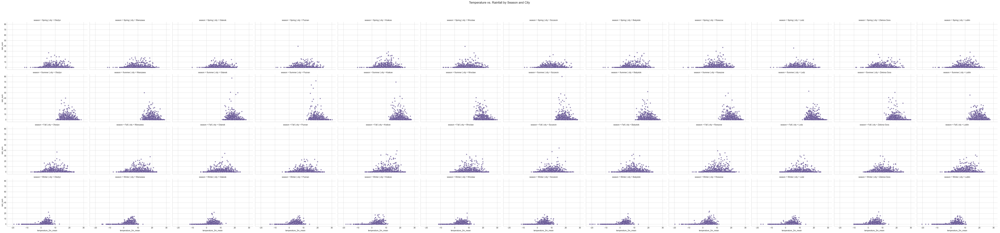

In [10]:
# Create a function for more complex cross-variable analysis
def analyze_variable_relationships(df, x_var, y_var, hue_var=None, size_var=None):
    """Create detailed analysis of relationship between variables"""
    plt.figure(figsize=(12, 6))
    
    # Main scatter plot
    if hue_var and size_var:
        sns.scatterplot(data=df, x=x_var, y=y_var, hue=hue_var, size=size_var, alpha=0.6)
    elif hue_var:
        sns.scatterplot(data=df, x=x_var, y=y_var, hue=hue_var, alpha=0.6)
    else:
        sns.scatterplot(data=df, x=x_var, y=y_var, alpha=0.6)
    
    plt.title(f'Relationship between {y_var} and {x_var}', fontsize=14)
    plt.grid(True, alpha=0.3)
    
    # Add regression line
    sns.regplot(data=df, x=x_var, y=y_var, scatter=False, color='red')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate correlation
    correlation = df[[x_var, y_var]].corr().iloc[0, 1]
    print(f"Correlation between {x_var} and {y_var}: {correlation:.4f}")
    
    # Show conditional statistics if a hue variable is provided
    if hue_var and hue_var in df.columns:
        print(f"\nStatistics by {hue_var} groups:")
        group_stats = df.groupby(hue_var)[[x_var, y_var]].agg(['mean', 'std'])
        display(group_stats)

# Analyze important relationships
analyze_variable_relationships(df, 'temperature_2m_mean', 'rain_sum', 'season')
analyze_variable_relationships(df, 'relative_humidity_2m_mean', 'cloud_cover_mean', 'season')
analyze_variable_relationships(df, 'temperature_2m_mean', 'soil_temperature_0_to_7cm_mean', 'city')
analyze_variable_relationships(df, 'rain_sum', 'soil_moisture_0_to_7cm_mean', 'month')

# Create a multi-faceted relational plot
g = sns.FacetGrid(df, col='city', row='season', height=4, aspect=1.5)
g.map_dataframe(sns.scatterplot, x='temperature_2m_mean', y='rain_sum', alpha=0.6)
g.add_legend()
g.fig.suptitle('Temperature vs. Rainfall by Season and City', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()


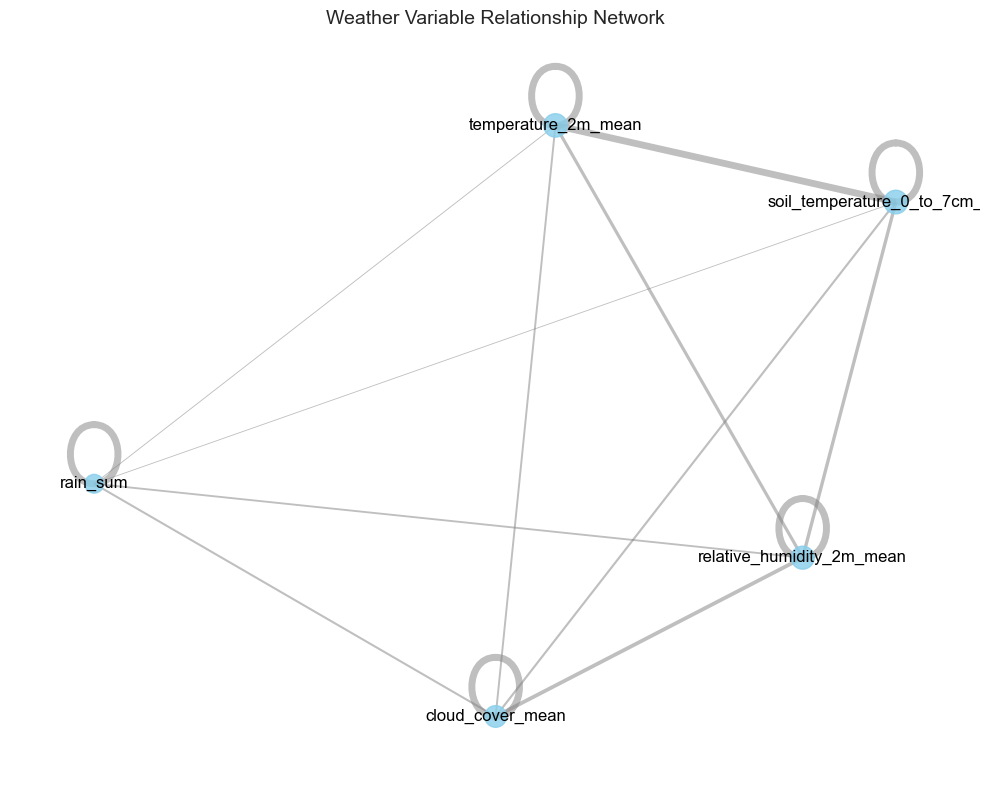

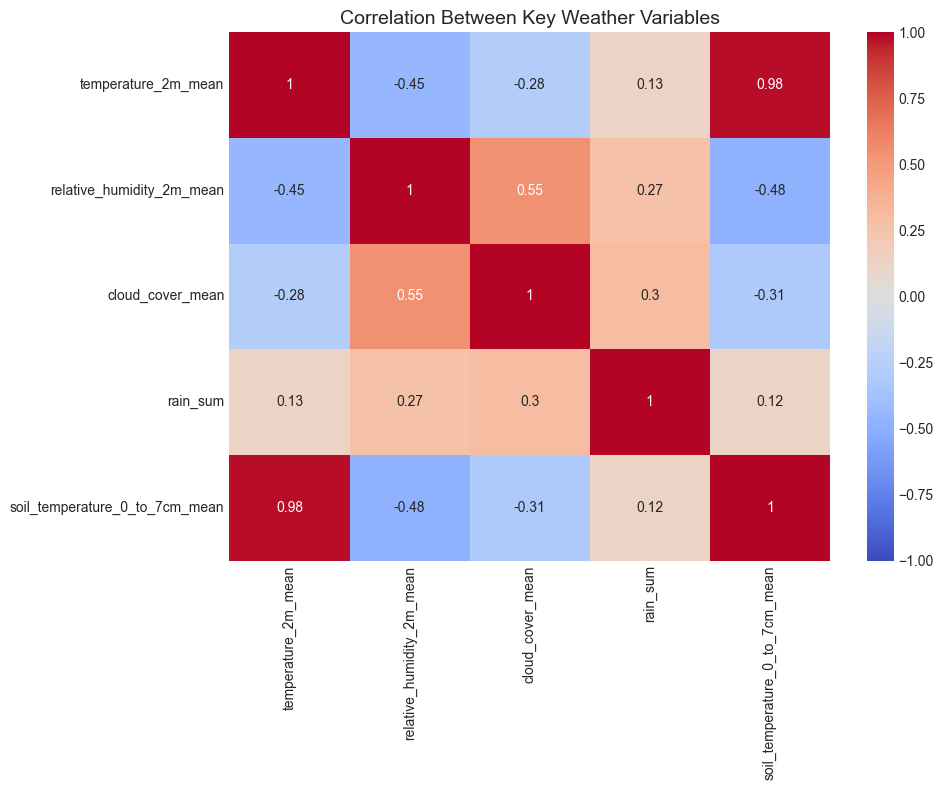

### Weather Variable Relationship Summary ###

Pairwise Correlations (sorted by absolute value):
temperature_2m_mean vs soil_temperature_0_to_7cm_mean: 0.982
relative_humidity_2m_mean vs cloud_cover_mean: 0.546
relative_humidity_2m_mean vs soil_temperature_0_to_7cm_mean: -0.483
temperature_2m_mean vs relative_humidity_2m_mean: -0.453
cloud_cover_mean vs soil_temperature_0_to_7cm_mean: -0.310
cloud_cover_mean vs rain_sum: 0.298
temperature_2m_mean vs cloud_cover_mean: -0.280
relative_humidity_2m_mean vs rain_sum: 0.269
temperature_2m_mean vs rain_sum: 0.131
rain_sum vs soil_temperature_0_to_7cm_mean: 0.123

Strongest relationship: temperature_2m_mean vs soil_temperature_0_to_7cm_mean (corr=0.982)
Weakest relationship: rain_sum vs soil_temperature_0_to_7cm_mean (corr=0.123)



In [11]:
# --- Analyze relationships between temperature and other variables ---
relation_vars = ['temperature_2m_mean', 'relative_humidity_2m_mean', 
                 'cloud_cover_mean', 'rain_sum', 'soil_temperature_0_to_7cm_mean']

# Create a correlation matrix specifically for these variables
relation_corr = df[relation_vars].corr()

# --- Create textual summary for LLM ---
summary_text = "### Weather Variable Relationship Summary ###\n\n"

# Pairwise correlations (sorted by strength)
summary_text += "Pairwise Correlations (sorted by absolute value):\n"
sorted_corrs = []
for i, var1 in enumerate(relation_vars):
    for j, var2 in enumerate(relation_vars):
        if j > i:
            sorted_corrs.append((var1, var2, relation_corr.loc[var1, var2]))

# Sort by absolute correlation descending
sorted_corrs = sorted(sorted_corrs, key=lambda x: abs(x[2]), reverse=True)
for var1, var2, corr_value in sorted_corrs:
    summary_text += f"{var1} vs {var2}: {corr_value:.3f}\n"

# Identify strongest and weakest relationships
strongest = sorted_corrs[0]
weakest = sorted_corrs[-1]
summary_text += (
    f"\nStrongest relationship: {strongest[0]} vs {strongest[1]} "
    f"(corr={strongest[2]:.3f})\n"
    f"Weakest relationship: {weakest[0]} vs {weakest[1]} "
    f"(corr={weakest[2]:.3f})\n"
)

# --- Visualize correlation with a network graph ---
plt.figure(figsize=(10, 8))
G = nx.from_pandas_adjacency(relation_corr.abs())
pos = nx.spring_layout(G, seed=42)

# Edge widths = correlation strength
edge_widths = [abs(relation_corr.loc[u, v]) * 5 for u, v in G.edges()]

# Node sizes = average correlation with other variables
node_sizes = [500 * relation_corr.abs()[var].mean() for var in relation_vars]

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', alpha=0.8)
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.5, edge_color='gray')
nx.draw_networkx_labels(G, pos, font_size=12)

plt.title('Weather Variable Relationship Network', fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()

# --- Show correlation heatmap ---
plt.figure(figsize=(10, 8))
sns.heatmap(relation_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Between Key Weather Variables', fontsize=14)
plt.tight_layout()
plt.show()

# --- Print summary text for LLM ---
print(summary_text)